In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style='darkgrid')
pd.set_option('display.max_columns', None)

In [2]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import RocCurveDisplay, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, precision_recall_curve
from sklearn.model_selection import TunedThresholdClassifierCV, TimeSeriesSplit, RandomizedSearchCV
import mlflow
from sklearn.base import BaseEstimator, TransformerMixin

parquet_filename ='../data/processed/tac_co2_processed_v1.parquet'



In [3]:
mlflow.set_tracking_uri(
    "http://127.0.0.1:5000"
)
mlflow.sklearn.autolog()

mlflow.set_experiment('rolling_window_tac_co2_optical')

KeyboardInterrupt: 

In [3]:
def get_data_by_year(file_path, year_list):
    df = pd.read_parquet(file_path, filters=[('year', 'in', year_list)]).set_index('datetime')
    return df


In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.base import BaseEstimator, TransformerMixin

#==========================
class TSFE(BaseEstimator, TransformerMixin):
    def __init__(self, feature_cols,  feature_config):#, target_col='label1'):
        self.feature_cols = feature_cols
        #self.target_col = target_col
        self.feature_config = feature_config
    #==========
    def fit (self, X, y=None):
        return self
    #=============
    def _fill_Nan(self, df, feature_cols):
        df[feature_cols] = df[feature_cols].ffill().fillna(df[feature_cols].median()) # df[feature_cols].median()
        return df
    # ============
    def _ratio_featutre_gen(self, df, feature):
        
        df[f'{feature[0]}_{feature[1]}_ratio'] = df[feature[0]]/df[feature[1]]
        return df
    #===================
    def _diff_cross_gen(self, df, feature):
    
        df[f'{feature[0]}_{feature[1]}_diff_cross'] = df[feature[0]]-df[feature[1]]
        return df
    #=============
    def _multi_featutre_gen(self, df, feature):
        df[f'{feature[0]}_{feature[1]}_multi'] = df[feature[0]]*df[feature[1]]
        return df

    #=============== diff, lag, rolling
    def _diff_gen(self, df, feature, period):
        for p in period:
            df[f'{feature}_diff_{p}'] = (df[f'{feature}'].diff(p))#.fillna(df[f'{feature}_diff_{p}'].median())

        return df
    #===============
    def _lag_gen (self, df, feature, period):
        for p in period:
            df[f'{feature}_lag_{p}'] = (df[f'{feature}'].shift(p))#.fillna(df[f'{feature}_lag_{p}'].median())
        return df
    #===============
    def _per_change_feature_gen(self, df, feature):

        df[f'{feature[0]}_{feature[1]}_per_change'] = (df[feature[0]]/df[feature[1]])*100
        return df

    #===============
    def _rolling_std_gen (self, df, feature, period):
        for p in period:
            df[f'{feature}_roll_std_{p}'] = (df[f'{feature}'].rolling(window=p, closed='left').std())#.fillna(df[f'{feature}_roll_std_{p}'].median())# self not included, NAN->0
        return df

    #===============
    def _roll_mean_percent_res_gen(self, df, feature, period):
        for p in period:
            df[f'{feature}_roll_mean_{p}'] = df[f'{feature}'].rolling(window=p, closed='left').mean()#.fillna(df[f'{feature}_roll_mean_{p}'].median()) # self not included
            df[f'{feature}_residual_{p}'] = ((df[f'{feature}']- df[f'{feature}_roll_mean_{p}'])/(df[f'{feature}_roll_mean_{p}']))*100 # self not included
        return df
    #================
    def _Zscore_res_gen(self, df, feature):
        df[f'{feature[0]}_{feature[3]}_zcore_res_gen'] = ((df[feature[0]]-df[feature[1]])/df[feature[2]])
        return df
    #=================
    def _log_gen (self, df, feature):
        df[f'{feature}_log'] = np.sign(df[f'{feature}'])*np.log1p(np.abs(df[f'{feature}']))#.fillna(df[f'{feature}_lag_{p}'].median())
        return df
    #===========
    def _relative_per_gen(self, df, feature, period):
        for p in period:
            df[f'{feature}_relative_per_{p}'] = (df[f'{feature}']-(df[f'{feature}'].rolling(window=p, closed='left').min()))/((df[f'{feature}'].rolling(window=p, closed='left').max())-(df[f'{feature}'].rolling(window=p, closed='left').min())) #.fillna(df[f'{feature}_roll_std_{p}'].median())# self not included, NAN->0
        return df
    #=================
    def _per_rank_gen(self, df, feature, period):
        for p in period:
            df[f'{feature}_per_rank_{p}'] = df[f'{feature}'].rolling(window=p, closed='left').rank(pct=True)
        return df
    #=================
    def _feature_eng_apply(self, df, config):
        for opt, params in config.items():
            cols = params['cols']


            for feature in cols:
                if opt == 'diff':
                    period = params.get('period') or params.get('periods', 1)
                    df = self._diff_gen(df, feature, period)
                elif opt == 'ratio':
                    df = self._ratio_featutre_gen(df, feature)
                elif opt == 'diff_cross':
                    df = self._diff_cross_gen(df, feature)
                elif opt == 'multi':
                    df = self._multi_featutre_gen(df, feature)
                elif opt == 'lag':
                    period = params.get('period') or params.get('periods', 1)
                    df = self._lag_gen(df, feature, period)
                elif opt == 'per_change':
                    df = self._per_change_feature_gen(df, feature)
                elif opt == 'roll_std':
                    period = params.get('period') or params.get('periods', 1)
                    df = self._rolling_std_gen( df, feature, period)
                elif opt == 'roll_mean_percent_res':
                    period = params.get('period') or params.get('periods', 1)
                    df = self._roll_mean_percent_res_gen(df, feature, period)
                elif opt == 'Z_score_res':
                    df = self._Zscore_res_gen(df, feature)
                elif opt == 'log':
                    df = self._log_gen(df, feature)
                elif opt  =='relative_per':
                    period = params.get('period') or params.get('periods', 1)
                    df = self._relative_per_gen(df, feature, period)
                elif opt == 'per_rank':
                    period = params.get('period') or params.get('periods', 1)
                    df = self._per_rank_gen(df, feature, period)

        return df 

    def transform(self, X):

        df = X.copy(deep=False)

        df = self._fill_Nan(df, self.feature_cols) # fill for original feature values

        df.index = pd.to_datetime(df.index)
        df = self._feature_eng_apply(df, self.feature_config)
        df = df.replace([np.inf, -np.inf], np.nan) # handle inf values, prevent Nan values
        df_columns = df.columns.tolist()
        df = self._fill_Nan(df, df_columns)

        floas_cols = df.select_dtypes(include=['float64']).columns
        df[floas_cols] = df[floas_cols].astype('float32')

        return df


In [5]:
feature_cols= [ 
         'co2_dry','co2_wet', 
        'co2_target_error',  #'co2_C',         'co2_N',     
        'co2_Cdrift', 'co2_Nfiltered', 
       'cycle_time', 'h2o', 'cavity_press', 'cavity_temp',
       'das_temp', 'etalon_temp', 'warmbox_temp', 'outlet_valve', #'datetime'
       'label1','cycle_time_diff','time_since_switch'
]

feature_config ={
    'diff':{'cols': [ 'warmbox_temp','cavity_temp',
                     'das_temp','cycle_time','cavity_press',
                     'h2o','co2_dry'], 'periods':[1, 2]},

    'lag':{'cols':['cycle_time'], 'periods':[1,2]},

    'roll_std':{'cols': ['cavity_press', 'cavity_temp',
            'das_temp', 'etalon_temp', 'warmbox_temp', 'co2_target_error','cycle_time'], 'period':['60s', '5min']},

    'roll_mean_percent_res':{'cols':['cycle_time','co2_target_error'], 'period': ['60s','5min']},

    'diff_cross':{'cols':[['co2_wet','co2_dry'],
                           ]}, 

    'log':{'cols':['h2o','co2_target_error'
                   #'CH4_end_time', 
                   ]},

    'multi':{'cols':[['h2o', 'co2_dry'],['cavity_press', 'cavity_temp'], ['outlet_valve','cavity_press_diff_1']]},

    'ratio':{'cols':[   
                        ['outlet_valve','cavity_press'], 
                        
                        
                        ['cycle_time_roll_std_5min', 'cycle_time_roll_mean_5min'], 
                        ['cavity_press_roll_std_5min', 'cavity_temp_roll_std_5min'],
                        ['cavity_press_roll_std_60s', 'cavity_temp_roll_std_60s'],
                       ]}, 


    #'per_change':{'cols':[['CH4_ht_diff_1', 'CH4_ht_lag_1'],['last_std_ht', 'last_air_ht']]},
    #'relative_per': {'cols': ['CH4_w', 'CH4_end_time','CH4_ht'], 'period':['2h','7h']},
    'Z_score_res':{'cols':[['co2_target_error', 'co2_target_error_roll_mean_5min', 'co2_target_error_roll_std_5min', '5min'], #['CH4_end_time', 'CH4_end_time_roll_mean_7D', 'CH4_end_time_roll_std_7D', '7D']
                           ]},
    'per_rank': {'cols': ['co2_target_error', 'co2_Cdrift'], 'period':['60s','5min']},


}

In [6]:
from sklearn.metrics import precision_recall_curve
def get_best_threshold(y_true, y_prob):
    precisions, recalls, thresholds = precision_recall_curve(y_true, y_prob)
    p = precisions[:-1]
    r = recalls[:-1]

    f1_scores = 2 * (p * r) / (p + r + 1e-7) # 1e-7 to prevent Nan

    best_index = np.argmax(f1_scores)
    best_thres = thresholds[best_index]
    return best_thres, f1_scores[best_index], p[best_index], r[best_index]


In [7]:
years_df = pd.read_parquet(parquet_filename, columns=['year'])
years = years_df['year'].unique()
tsfe = TSFE(feature_cols=feature_cols, feature_config=feature_config)
#===
start_year = years.min()
end_year = years.max()
print("Years begin from", start_year, "to", end_year)
#===== model
years

Years begin from 2012 to 2025


array([2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022,
       2023, 2024, 2025], dtype=int32)

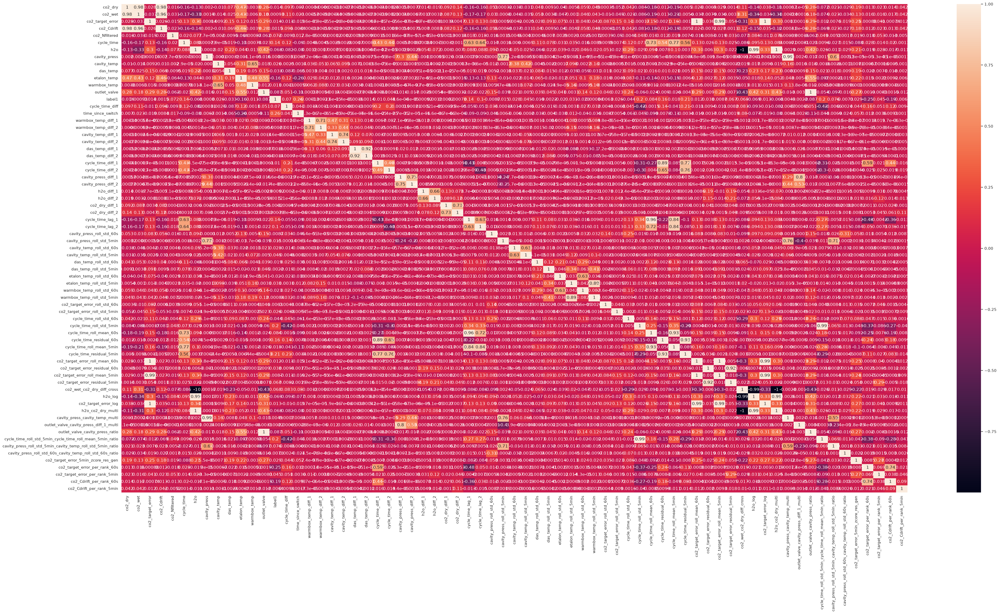

In [8]:
df = get_data_by_year(parquet_filename, years)
switch_flag = df['port'].ne(df['port'].shift(1))|df['sample'].ne(df['sample'].shift(1))


switch_group = switch_flag.cumsum()

group_start_time = pd.Series(df.index, index=df.index).groupby(switch_group).transform('first')

df['time_since_switch'] = (df.index -group_start_time ).dt.total_seconds()

group_start_cycle = df['cycle_time'].groupby(switch_group).transform('first')

df['cycle_time_diff'] = df['cycle_time'] - group_start_cycle

df_trans =  tsfe.fit_transform(df[feature_cols])
plt.subplots(figsize=(50,25))
sns.heatmap(df_trans.corr(), annot=True)
plt.show()


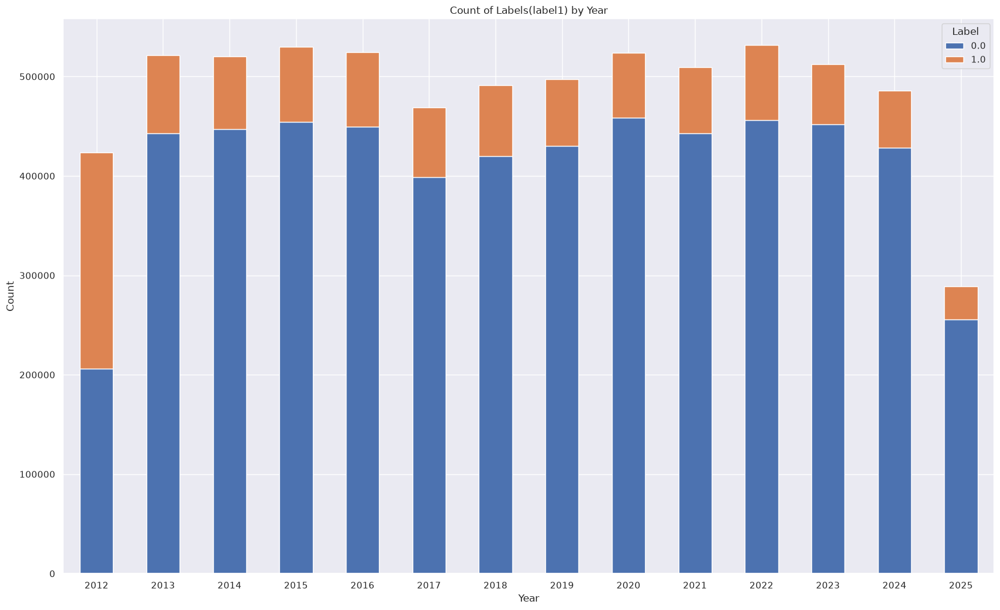

In [9]:
df_counts = pd.crosstab(df['year'], df['label1'])

ax = df_counts.plot(kind='bar', stacked=True, figsize=(20, 12))

plt.title('Count of Labels(label1) by Year')
plt.xlabel('Year')
plt.ylabel('Count')

plt.xticks(rotation=0)

plt.legend(title='Label')
plt.show()

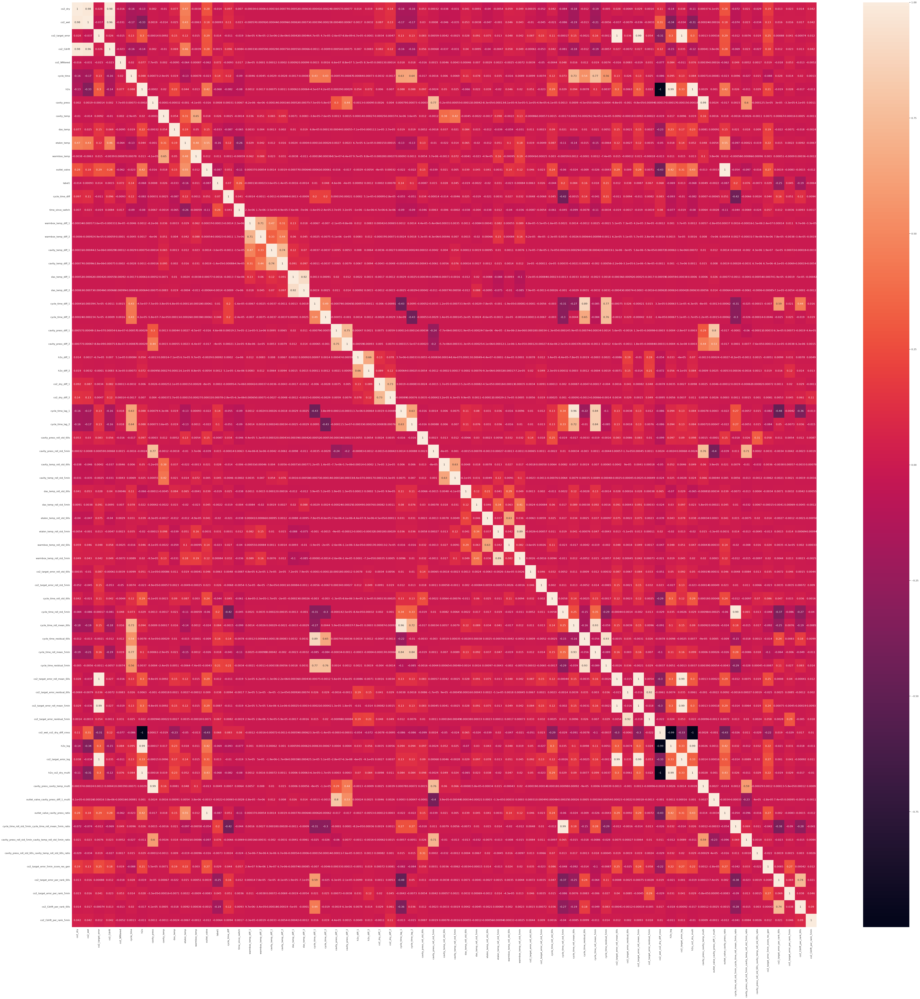

In [10]:
plt.subplots(figsize=(80,80))
sns.heatmap(df_trans.corr(), annot=True)
plt.show()

In [11]:
top_corr_abs = (
    df_trans.corr()['label1']
    .abs()
    .drop('label1')
    .sort_values(ascending=False)
    .head(25)
)
print(df_trans.corr().loc[top_corr_abs.index, 'label1'])

time_since_switch                                             0.259575
co2_target_error_per_rank_60s                                -0.247600
cycle_time_residual_5min                                      0.213872
cycle_time_roll_std_5min_cycle_time_roll_mean_5min_ratio      0.201276
cycle_time_roll_std_5min                                      0.198153
co2_Cdrift_per_rank_60s                                      -0.186191
cycle_time_residual_60s                                       0.159668
etalon_temp                                                  -0.158855
cycle_time                                                    0.143820
cycle_time_lag_1                                              0.135008
cycle_time_lag_2                                              0.103212
outlet_valve                                                 -0.087189
outlet_valve_cavity_press_ratio                              -0.087134
cycle_time_roll_mean_60s                                      0.083928
cavity

In [13]:
top_corr_abs.index.tolist()

['time_since_switch',
 'co2_target_error_per_rank_60s',
 'cycle_time_residual_5min',
 'cycle_time_roll_std_5min_cycle_time_roll_mean_5min_ratio',
 'cycle_time_roll_std_5min',
 'co2_Cdrift_per_rank_60s',
 'cycle_time_residual_60s',
 'etalon_temp',
 'cycle_time',
 'cycle_time_lag_1',
 'cycle_time_lag_2',
 'outlet_valve',
 'outlet_valve_cavity_press_ratio',
 'cycle_time_roll_mean_60s',
 'cavity_press_roll_std_5min_cavity_temp_roll_std_5min_ratio',
 'co2_Nfiltered',
 'cycle_time_diff',
 'h2o_log',
 'co2_wet_co2_dry_diff_cross',
 'h2o',
 'h2o_co2_dry_multi',
 'co2_target_error_residual_5min',
 'cycle_time_diff_2',
 'co2_target_error_per_rank_5min',
 'cavity_temp_roll_std_5min']

In [16]:
feature_ml = ['time_since_switch',
 'co2_target_error_per_rank_60s',
 'cycle_time_residual_5min',
 'cycle_time_roll_std_5min_cycle_time_roll_mean_5min_ratio',
 'cycle_time_roll_std_5min',
 'co2_Cdrift_per_rank_60s',
 'cycle_time_residual_60s',
 'etalon_temp',
 'cycle_time',
 'cycle_time_lag_1',
 'cycle_time_lag_2',
 'outlet_valve',
 'outlet_valve_cavity_press_ratio',
 'cycle_time_roll_mean_60s',
 'cavity_press_roll_std_5min_cavity_temp_roll_std_5min_ratio',
 'co2_Nfiltered',
 'cycle_time_diff',
 'h2o_log',
 'co2_wet_co2_dry_diff_cross',
 'h2o',
 'h2o_co2_dry_multi',
 'co2_target_error_residual_5min',
 'cycle_time_diff_2',
 'co2_target_error_per_rank_5min',
 'cavity_temp_roll_std_5min']

In [14]:
pipe_rnd = Pipeline([
    #('scl', StandardScaler()),
    ('clf', RandomForestClassifier())
])
param_grid = {
    'clf__n_estimators': [200],
    'clf__max_depth': [5, 8],
    'clf__min_samples_leaf':[15],
    'clf__random_state':[42],
    'clf__max_features':['sqrt'],
    'clf__n_jobs':[4],
    'clf__class_weight':['balanced']
}

In [15]:
def add_columns(df):
    switch_flag = df['port'].ne(df['port'].shift(1))|df['sample'].ne(df['sample'].shift(1))


    switch_group = switch_flag.cumsum()

    group_start_time = pd.Series(df.index, index=df.index).groupby(switch_group).transform('first')

    df['time_since_switch'] = (df.index -group_start_time ).dt.total_seconds()

    group_start_cycle = df['cycle_time'].groupby(switch_group).transform('first')

    df['cycle_time_diff'] = df['cycle_time'] - group_start_cycle

    return df

In [ ]:
window = 1
all_results = []
with mlflow.start_run(run_name="0721_new_v1") as parent_run:
    for start_year in years:
        train_years = list(range(start_year, start_year + window))
        test_years = [start_year + window]
        print("train_years:", train_years)
        print("test_years:", test_years)
        if test_years not in years:
            print(f"{test_years} data not in the dataset")
            break

        data_train = get_data_by_year(parquet_filename, train_years)
        data_test = get_data_by_year(parquet_filename, test_years)
        data_train = add_columns(data_train)
        data_test = add_columns(data_test)

        #=========
        #data_train['datetime'] = pd.to_datetime(data_train['datetime'])
        #data_train = data_train.set_index('datetime').sort_index()
        #data_test['datetime'] = pd.to_datetime(data_test['datetime'])
       # data_test = data_test.set_index('datetime').sort_index()
        
        #data_train['datetime'] = pd.to_datetime(data_train['datetime'])
        #data_test['datetime'] = pd.to_datetime(data_test['datetime'])
        
        X_train = data_train[feature_cols]
        y_train = data_train['label1']
        X_test = data_test[feature_cols]
        y_test = data_test['label1']
        # feature engineering
        X_train = tsfe.fit_transform(X_train)
        X_test = tsfe.transform(X_test)

        #
        X_train_final = X_train [feature_ml]
        X_test_final = X_test [feature_ml]
        y_train.index= X_train_final.index
        y_test.index =X_test_final.index
        grid = GridSearchCV(estimator=pipe_rnd, param_grid = param_grid,  scoring='average_precision', n_jobs=4, return_train_score=True)
        grid.fit(X_train_final, y_train)
        
        #model = random_forest_model(
        #X_train_final, y_train, X_test_final, y_test,
        #feature_names=feature_cols,
       # experiment_run_name=f'rolling_{start_year}_{start_year+4}', n_estimators=100, max_depth=8, n_jobs=-1,
       # threshold=0.5,class_weight=None
       # )
       #====== 
        y_prob = grid.predict_proba(X_test_final)[:, 1]
        best_threshold, best_f1, best_prec, best_rec = get_best_threshold(y_test, y_prob)
        y_proba_best = (y_prob >= best_threshold).astype(int)

        all_results.append({
            "training_years": f"{start_year}_{end_year-1}",
            "testing year":test_years,
            "threshold":best_threshold,
            "F1-score":best_f1,
            "Precision": best_rec,
            "Recall":best_rec,
            "train_size":len(data_train),
            "test_size":len(data_test)
        })
    rolling_results = pd.DataFrame(all_results)



train_years: [2012]
test_years: [np.int32(2013)]


/home/ellie/research_project/.venv/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


train_years: [2013]
test_years: [np.int32(2014)]


/home/ellie/research_project/.venv/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


train_years: [2014]
test_years: [np.int32(2015)]


/home/ellie/research_project/.venv/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


train_years: [2015]
test_years: [np.int32(2016)]


/home/ellie/research_project/.venv/lib/python3.13/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


train_years: [2016]
test_years: [np.int32(2017)]


In [ ]:
fig, ax = plt.subplots(figsize=(8,5))
sns.lineplot(data=rolling_results, x='testing year', y='F1-score',ax=ax, label='unbalanced', marker='o')
ax.set_title("F1-score Comparision unbalanced vs balanced")
ax.set_ylabel('F1-score')
ax.set_xlabel('testing year')
plt.legend()
plt.show()

In [ ]:
# threshold
fig, ax = plt.subplots(figsize=(8,5))
sns.lineplot(data=rolling_results, x='testing year', y='threshold',ax=ax, label='unbalanced', marker='o')
sns.lineplot(data=rolling_results_balanced, x='testing year', y='threshold',ax=ax, label='balanced',marker='o')
ax.set_title("Threshold Comparision unbalanced vs balanced")
ax.set_ylabel('Threshold')
ax.set_xlabel('testing year')
plt.legend()
plt.show()